In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from IPython.display import display, HTML
from ipywidgets import interact, FloatSlider, IntSlider, Button, Output 
display(HTML("<style>.rendered_html.text_cell_render {max-width:600px; }</style>")) 

# Denoising Diffusion Probabilistic Models

Basic implementation of a text-to-image diffusion model trained on the MNIST handwritten digits database.

For more details see our [blog post](https://cgn.ai/blog/diffusion_101.html) and the paper

> Denoising Diffusion Probabilistic Models, Ho et al., 2020
>
> - Arxiv: https://arxiv.org/abs/2006.11239
> - Github repo for the paper:
> https://github.com/hojonathanho/diffusion

Other resources:
- https://cgn.ai/blog/diffusion_101.html
- https://huggingface.co/blog/annotated-diffusion

## Imports and Constants

Import required libraries and define global model constants.

In [2]:
import torch
from torch import cuda
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torch.utils.data.dataloader import DataLoader

from pytorch_lightning import loggers as pl_loggers

from cgnai.nn.training import BatchLoss, TrainingLoop
from cgnai.nn.unet import Unet
from cgnai.utils import cgnai_home

import matplotlib.pyplot as plt
import numpy as np

In [3]:
# model constants
B = 512 # batch size
T = 200
beta_1 = 1e-4
beta_T = 0.02

# torch init
device   = 'cuda' if cuda.is_available() else 'cpu'
seed     = torch.seed()
seed_gen = torch.manual_seed(seed)

## Diffusion Model

Definition of the diffusion model. This implementation uses the [U-Net](https://en.wikipedia.org/wiki/U-Net) architecture to predict the noise $\epsilon$. The U-Net implemenation is taken from [here](https://huggingface.co/blog/annotated-diffusion). See our [blog post](https://cgn.ai/blog/diffusion_101.html) for more information.


Notation:
- $T$ &mdash; number of diffusion steps
- $\beta_t$ &mdash; `beta[t]`
- $\alpha_t$ &mdash; `alpha[t]`
- $\bar\alpha_t$ &mdash; `alpha_bar[t]`
- $\epsilon_\theta$ &mdash; $\epsilon$ model
- We have: `len(alpha) = len(beta) = len(alpha_bar) = T+1`

Resources:
- U-Net - https://en.wikipedia.org/wiki/U-Net
- Diffusion 101 - https://cgn.ai/blog/diffusion_101.html

In [4]:
def beta_schedule(beta_1, beta_T, T):
    """
    Generates a linear beta schedule starting at index 1.
    
    Args:
        t_steps (int): Number of diffusion steps to schedule betas for.

    Returns:
        Array of length t_steps + 1 with the first element set to 0.0
    """
    # paramters from https://arxiv.org/abs/2006.11239
    T_base = 1000.0

    # inverse-linearly scale beta with number of timesteps to make overall variance constant.
    scale = T_base / T
    betas = torch.linspace(beta_1 * scale, beta_T * scale, T)
    return torch.tensor([0.0, *betas])

In [5]:
def loss_simple(eps_hat, eps, t):
    """
    Simplified loss function from our blog post, Eq. 7.
    
    Args:
        eps:      ground truth noise
        eps_hat:  predicted noise
        t:        time coord
        
    Returns:
        Tensor of simplified losses.
    """
    # Norm is taken over last 2 dims: width, and height.
    return torch.mean( torch.norm(eps - eps_hat, dim=(-2,-1))**2 )

In [6]:
def normalize_pixels(img: torch.Tensor) -> torch.Tensor:
    """
    Scales image intensities from [0., 1.] into range [-1., 1.].
    
    Args:
        img: image with intensities in [0., 1.]
        
    Returns:
        Array of normalized pixels in [-1., 1.].
    """
    return 2 * img - 1.

In [7]:
sqrt = torch.sqrt    
tnsr = torch.tensor
nan  = float("nan")
N0   = lambda size, device=None: torch.normal(0, 1, size=size, device=None)

class DiffusionModel(nn.Module, BatchLoss):
    """
    Callable model implementation 
    returning the batch loss.
    """
    def __init__(self, *, eps_model, T, device=None):
        nn.Module.__init__(self)
        BatchLoss.__init__(self, device=device)

        self.model = eps_model
        self.T     = T
        
        self.register_buffer('beta', beta_schedule(beta_1, beta_T, self.T))
        self.register_buffer('alpha', 1 - self.beta)
        self.register_buffer('alpha_bar', torch.cumprod(self.alpha, dim=0))
        
        self.to(device)
    
    
    def parameters(self):
        return self.model.parameters()
    
    def state_dict(self):
        return {
            'state_dict': nn.Module.state_dict(self),
            'hparams'   : self.hparams
        }

    def restore_state(self, state_dict):
        if 'state_dict' not in state_dict: raise Error('"state_dict" missing in state')
        self.load_state_dict(state_dict['state_dict'])

        if 'hparams' not in state_dict: raise Error('"hparams" missing in state')
        self.T = state_dict['hparams']['timesteps']
    
    
    def q_t(self, t, x_0 , eps):
        """
        Forward model $q(x_t \mid x_0)$ 
        from Eq. 1 in our blog post.
        """
        t = t.view(-1, 1, 1, 1) # prepare for broadcasting to x0
        return sqrt(self.alpha_bar[t]) * x_0  +  sqrt(1 - self.alpha_bar[t]) * eps
    
    
    def batch_loss(self, b):
        """
        Computes the loss for a whole batch.
        """
        device = self.device

        x0, labels = b # img, labels
        B , _, _, _ = x0.size() # batch_size, channels, height, width

        t   = torch.randint(1, self.T + 1, size=(B,), device=device)
        x0  = normalize_pixels(x0)
        eps = N0(x0.size()).to(device)
        xt  = self.q_t(t=t, x_0=x0, eps=eps)
        eps_hat = self.model(xt, t, labels)

        L = loss_simple(eps_hat, eps, t)
        return L
    
    
    def __call__(self, b, *, training_step: int = None, training_epoch: int = None):
        L = self.batch_loss(b)
        print(training_epoch, training_step,  L.item(), end='\r')
        return L
        
    
    @torch.no_grad()
    def denoise(self, x, *, t0=1, t1=None, labels=None):
        """
        Reverse diffusion process.
        Algorithm 2 from the paper.
        """

        # Shorter notation to keep it simple.
        dev       = self.device
        eps_model = self.model
        a, a_, sig, ls = self.alpha, self.alpha_bar, sqrt(self.beta), labels
        t1 = self.T
        ts = torch.arange(t1, t0+1, step=-1, device=dev)
        
        if t1 is     None: t1 = self.T
        if ls is not None: ls = ls.to(dev)
        
        # The sequence we're gonna append the samples to
        xs = [x.to(dev)]
        noise_func = lambda: N0(x.size()).to(dev)
    
        # Reverse/Denoising steps
        for t in ts:
            xt      = xs[-1]
            z       = noise_func() if t >= 1 else 0.0
            eps_hat = eps_model(xt, t.unsqueeze(0), ls)
            mu      = 1/sqrt(a[t]) * (xt  - (1 - a[t])/sqrt(1 - a_[t]) * eps_hat) 
            x       = mu + sig[t]*z
            xs.append(x)

        return torch.stack(xs)

## Training (no conditioning)

Set up training loop and train for a bunch of epochs.

In [ ]:
epochs = 20

data = MNIST("_data", train=True, download=True, transform=transforms.ToTensor())
dl   = DataLoader(data, batch_size=B, generator=seed_gen, num_workers=4)

logger    = pl_loggers.CSVLogger(save_dir='.', name="./")
eps_model = Unet(dim=28, channels=1, dim_mults=(1, 2, 4), with_label_conditioning=False)
diffusion = DiffusionModel(eps_model=eps_model, T=T, device=device)

In [9]:
loop = TrainingLoop(
    data_loader = dl,
    batch_loss  = diffusion, 
    opt         = torch.optim.Adam, 
    logger      = logger,
    callbacks   = {})

In [ ]:
loop.run(epochs);

## Inference - Generating images from noise

Next we start with Gaussian noise and run the backwards process to generate MNIST examples.

In [10]:
from cgnai.plotting import ani
from IPython.display import display, HTML, Markdown, Video, Image

In [11]:
eps_model = Unet(dim=28, channels=1, dim_mults=(1, 2, 4), with_label_conditioning=False)
diffusion = DiffusionModel(eps_model=eps_model, T=T, device=device)

batchloss device:cpu
hparams:
{'device': 'cpu'}


In [12]:
check_path = cgnai_home()/"shared/diffusion/ckpt_T200_beta_1e-4_0.02/state.tar"
state_dict = torch.load(check_path, map_location=torch.device(device))
diffusion.restore_state(state_dict['batch_loss_state_dict'])

In [13]:
N  = 20
xs = diffusion.denoise(x = torch.normal(0, 1, size=(N, 1, 28, 28)))
print(xs.size())

torch.Size([199, 20, 1, 28, 28])


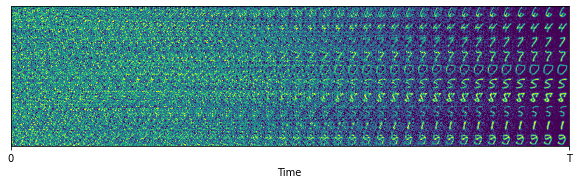

In [20]:
im = torch.cat(list(xs[::5,:10,0,:,:]), dim=-1)
im = torch.cat(list(im), dim=-2)
# -----------------------------
plt.figure(figsize=(10,4))
plt.imshow(im, vmin=-1, vmax=1)
plt.xlabel("Time");
plt.xticks([0,T//5*28],["0","T"]);
plt.yticks([]);
plt.savefig("diffusion_rollout.png", bbox_inches='tight', dpi=300)

In [13]:
def to_im(x, k):
    spl = torch.split(x, k, dim=0)
    im  = torch.cat(list(torch.cat(spl, dim=-1)), dim=-2)    
    return im.numpy()

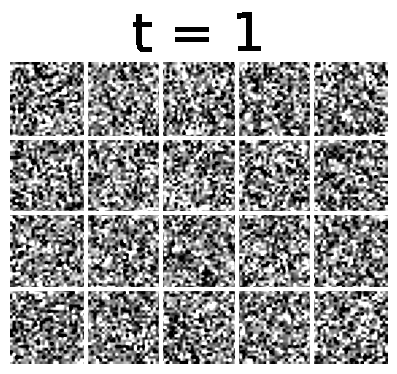

In [24]:
# Collection of fnames for all 
# the frames in the final gif
F = [] 

# Create temporal folder to store 
# animation frames
folder = "_ani_temp"
!mkdir -p $folder

# Create the frames for the ani
# ...don't mind the range hack
for i in [*np.arange(0, len(xs), 5), len(xs)-1]:
    
    print(f"{i+1}/{len(xs)}", end="\r")

    im = to_im(xs[i,:,0,:,:], 4)
    # -----------------------
    plt.rcParams.update({'font.size': 32})
    plt.figure(figsize=(5,4))
    plt.title(f"t = {i+1}")
    plt.axis("off")
    for j in range(1, 4): plt.hlines(j*28 - 0.5, -0.5,28*5, linewidth=3, color="w")
    for j in range(1, 5): plt.vlines(j*28 - 0.5, -0.5,28*5, linewidth=3, color="w")
    val = 1.0
    plt.imshow(im, vmin=-val, vmax=val, cmap="binary_r")
    
    # Save the frames     
    fname = f"{folder}/{i}.png"
    F.append(fname)
    plt.savefig(fname, bbox_inches='tight', dpi=100)
    plt.close()

    
# Repeat the last images to freeze time
for _ in range(40): F.append(F[-1])
    
# Create the gif animation
fname = "diffusion_mnist.gif"
ani(fname, F)
Image(fname, width=140)